In [1]:
# Copyright 2025 Bytedance Ltd. and/or its affiliates.
# SPDX-License-Identifier: Apache-2.0

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from copy import deepcopy
from typing import (
    Any,
    AsyncIterable,
    Callable,
    Dict,
    Generator,
    List,
    NamedTuple,
    Optional,
    Tuple,
    Union,
)
import requests
from io import BytesIO

from PIL import Image
import torch
from accelerate import infer_auto_device_map, load_checkpoint_and_dispatch, init_empty_weights

from data.transforms import ImageTransform
from data.data_utils import pil_img2rgb, add_special_tokens
from modeling.bagel import (
    BagelConfig, Bagel, Qwen2Config, Qwen2ForCausalLM, SiglipVisionConfig, SiglipVisionModel
)
from modeling.qwen2 import Qwen2Tokenizer
from modeling.bagel.qwen2_navit import NaiveCache
from modeling.autoencoder import load_ae
from safetensors.torch import load_file

/data01/yjf/miniconda3/envs/bagel2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Model Initialization

In [4]:
# model_path = "/data01/yjf/pretrained_models/BAGEL-7B-MoT"  # Download from https://huggingface.co/ByteDance-Seed/BAGEL-7B-MoT
model_path = "/data01/yjf/Bagel/results/checkpoints/0001200"

# LLM config preparing
llm_config = Qwen2Config.from_json_file(os.path.join(model_path, "llm_config.json"))
llm_config.qk_norm = True
llm_config.tie_word_embeddings = False
llm_config.layer_module = "Qwen2MoTDecoderLayer"

# ViT config preparing
vit_config = SiglipVisionConfig.from_json_file(os.path.join(model_path, "vit_config.json"))
vit_config.rope = False
vit_config.num_hidden_layers = vit_config.num_hidden_layers - 1

# VAE loading
vae_model, vae_config = load_ae(local_path=os.path.join(model_path, "ae.safetensors"))

# Bagel config preparing
config = BagelConfig(
    visual_gen=True,
    visual_und=True,
    llm_config=llm_config, 
    vit_config=vit_config,
    vae_config=vae_config,
    vit_max_num_patch_per_side=70,
    connector_act='gelu_pytorch_tanh',
    latent_patch_size=2,
    max_latent_size=64,
)

with init_empty_weights():
    language_model = Qwen2ForCausalLM(llm_config)
    vit_model      = SiglipVisionModel(vit_config)
    model          = Bagel(language_model, vit_model, config)
    model.vit_model.vision_model.embeddings.convert_conv2d_to_linear(vit_config, meta=True)

# Tokenizer Preparing
tokenizer = Qwen2Tokenizer.from_pretrained(model_path)
tokenizer, new_token_ids, _ = add_special_tokens(tokenizer)

# Image Transform Preparing
vae_transform = ImageTransform(1024, 512, 16)
vit_transform = ImageTransform(980, 224, 14)

## Model Loading and Multi GPU Infernece Preparing

In [5]:
max_mem_per_gpu = "40GiB"  # Modify it according to your GPU setting. On an A100, 80 GiB is sufficient to load on a single GPU.
import os
# os.environ["CUDA_VISIBLE_DEVICES"] = "6, 7"
torch.cuda.set_device(6)
print("Current device:", torch.cuda.current_device())  # 确认当前使用的 GPU
device_map = infer_auto_device_map(
    model,
    max_memory={i: max_mem_per_gpu for i in range(torch.cuda.device_count())},
    no_split_module_classes=["Bagel", "Qwen2MoTDecoderLayer"],
)
print(device_map)

same_device_modules = [
    'language_model.model.embed_tokens',
    'time_embedder',
    'latent_pos_embed',
    'vae2llm',
    'llm2vae',
    'connector',
    'vit_pos_embed'
]
print(torch.cuda.device_count())
if torch.cuda.device_count() == 1:
    first_device = device_map.get(same_device_modules[0], "cuda:0")
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device
        else:
            device_map[k] = "cuda:0"
else:
    first_device = device_map.get(same_device_modules[0])
    for k in same_device_modules:
        if k in device_map:
            device_map[k] = first_device

# Thanks @onion-liu: https://github.com/ByteDance-Seed/Bagel/pull/8
model = load_checkpoint_and_dispatch(
    model,
    checkpoint=os.path.join(model_path, "ema.safetensors"),
    device_map=device_map,
    offload_buffers=True,
    dtype=torch.bfloat16,
    force_hooks=True,
    offload_folder="/tmp/offload"
)

model = model.eval()
print('Model loaded')

The safetensors archive passed at /data01/yjf/Bagel/results/checkpoints/0001200/ema.safetensors does not contain metadata. Make sure to save your model with the `save_pretrained` method. Defaulting to 'pt' metadata.


Current device: 6
OrderedDict([('language_model.model.embed_tokens', 0), ('language_model.model.layers.0', 0), ('language_model.model.layers.1', 0), ('language_model.model.layers.2', 0), ('language_model.model.layers.3', 0), ('language_model.model.layers.4', 0), ('language_model.model.layers.5', 0), ('language_model.model.layers.6', 0), ('language_model.model.layers.7', 0), ('language_model.model.layers.8', 0), ('language_model.model.layers.9', 0), ('language_model.model.layers.10', 0), ('language_model.model.layers.11', 0), ('language_model.model.layers.12', 0), ('language_model.model.layers.13', 0), ('language_model.model.layers.14', 0), ('language_model.model.layers.15', 0), ('language_model.model.layers.16', 0), ('language_model.model.layers.17', 0), ('language_model.model.layers.18', 0), ('language_model.model.layers.19', 0), ('language_model.model.layers.20', 1), ('language_model.model.layers.21', 1), ('language_model.model.layers.22', 1), ('language_model.model.layers.23', 1), (

Model loaded


## Inferencer Preparing 

In [6]:
from inferencer import InterleaveInferencer

inferencer = InterleaveInferencer(
    model=model, 
    vae_model=vae_model, 
    tokenizer=tokenizer, 
    vae_transform=vae_transform, 
    vit_transform=vit_transform, 
    new_token_ids=new_token_ids
)

In [7]:
import random
import numpy as np

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

**About Inference Hyperparameters:**
- **`cfg_text_scale`:** Controls how strongly the model follows the text prompt. `1.0` disables text guidance. Typical range: `4.0–8.0`.
- **`cfg_image_scale`:** Controls how much the model preserves input image details. `1.0` disables image guidance. Typical range: `1.0–2.0`.
- **`cfg_interval`:** Fraction of denoising steps where CFG is applied. Later steps can skip CFG to reduce computation. Typical: `[0.4, 1.0]`.
- **`timestep_shift`:** Shifts the distribution of denoising steps. Higher values allocate more steps at the start (affects layout); lower values allocate more at the end (improves details).
- **`num_timesteps`:** Total denoising steps. Typical: `50`.
- **`cfg_renorm_min`:** Minimum value for CFG-Renorm. `1.0` disables renorm. Typical: `0`.
- **`cfg_renorm_type`:** CFG-Renorm method:  
  - `global`: Normalize over all tokens and channels (default for T2I).
  - `channel`: Normalize across channels for each token.
  - `text_channel`: Like `channel`, but only applies to text condition (good for editing, may cause blur).
- **If edited images appear blurry, try `global` CFG-Renorm, decrease `cfg_renorm_min` or decrease `cfg_scale`.**


## Image Generation

In [10]:
inference_hyper=dict(
    cfg_text_scale=4.0,
    cfg_img_scale=1.0,
    cfg_interval=[0.4, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="global",
)

In [ ]:
prompt = "A female cosplayer portraying an ethereal fairy or elf, wearing a flowing dress made of delicate fabrics in soft, mystical colors like emerald green and silver. She has pointed ears, a gentle, enchanting expression, and her outfit is adorned with sparkling jewels and intricate patterns. The background is a magical forest with glowing plants, mystical creatures, and a serene atmosphere."

print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **inference_hyper)
display(output_dict['image'])

## Image Generation with Think

In [ ]:
inference_hyper=dict(
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
    cfg_text_scale=4.0,
    cfg_img_scale=1.0,
    cfg_interval=[0.4, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="global",
)

In [ ]:
prompt = 'a car made of small cars'

print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, think=True, **inference_hyper)
print(output_dict['text'])
display(output_dict['image'])

## Editing

In [8]:
inference_hyper=dict(
    cfg_text_scale=4.0,
    cfg_img_scale=2.0,
    cfg_interval=[0.0, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="text_channel",
)

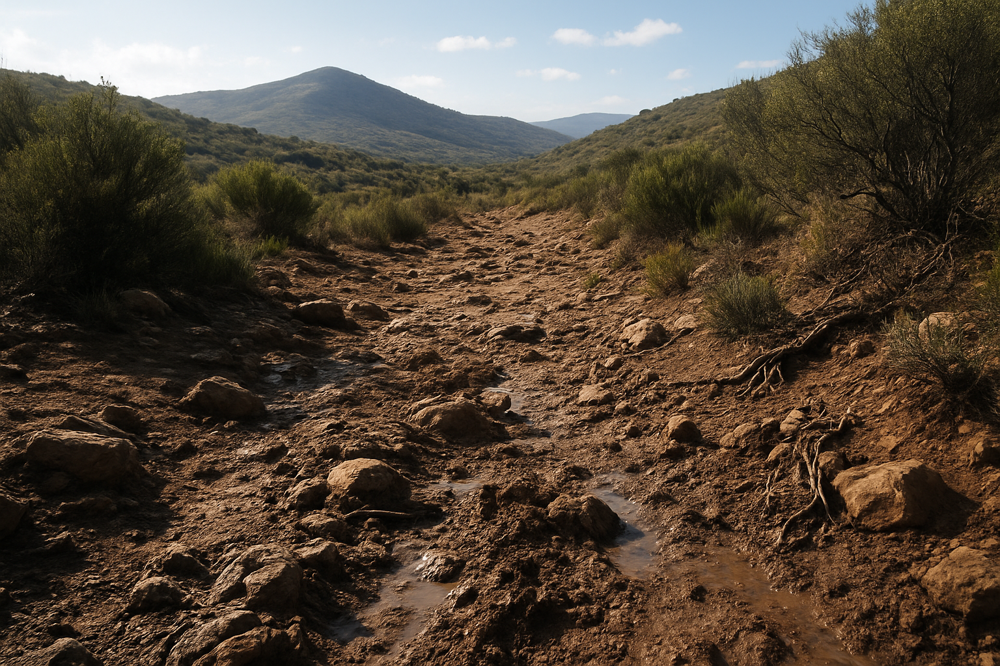

Transform this off-road scene—featuring uneven rocky terrain, scattered vegetation, and muddy ground—by introducing extreme weather conditions: convert the environment into a dense-fog scenario that significantly reduces visibility, or alternatively into a heavy-snowstorm setting where thick snowfall accumulates on the terrain and partially obscures surface features.
----------


100%|██████████| 49/49 [00:48<00:00,  1.01it/s]


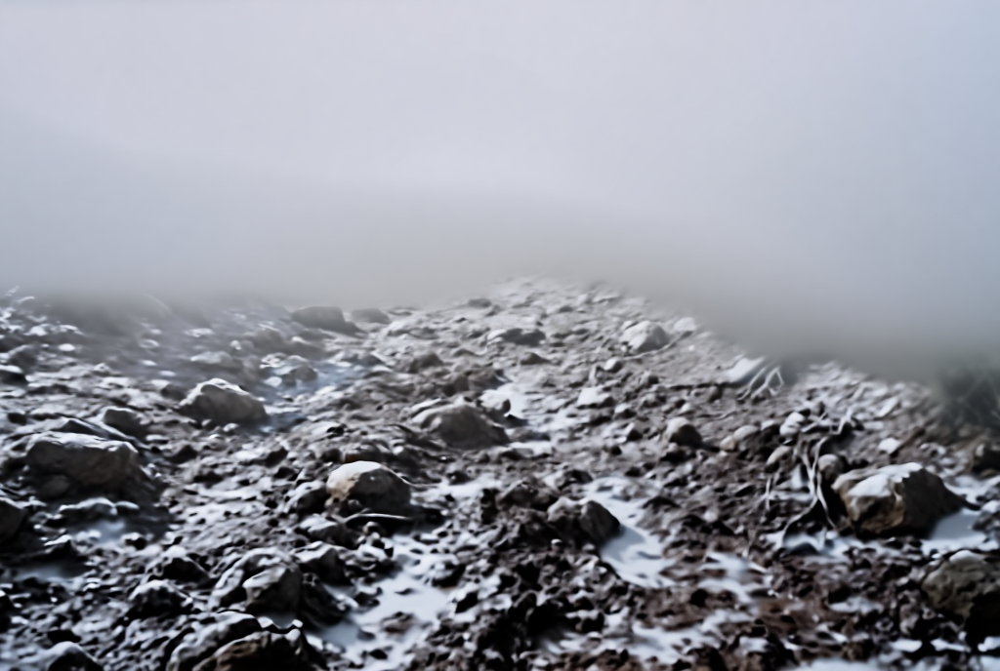

In [9]:

image = Image.open('test_images/yjf_test.png')
prompt = 'Transform this off-road scene—featuring uneven rocky terrain, scattered vegetation, and muddy ground—by introducing extreme weather conditions: convert the environment into a dense-fog scenario that significantly reduces visibility, or alternatively into a heavy-snowstorm setting where thick snowfall accumulates on the terrain and partially obscures surface features.'

display(image)
print(prompt)
print('-'*10)
output_dict = inferencer(image=image, text=prompt, **inference_hyper)
display(output_dict['image'])

## Edit with Think

In [10]:
inference_hyper=dict(
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
    cfg_text_scale=4.0,
    cfg_img_scale=2.0,
    cfg_interval=[0.0, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="text_channel",
)

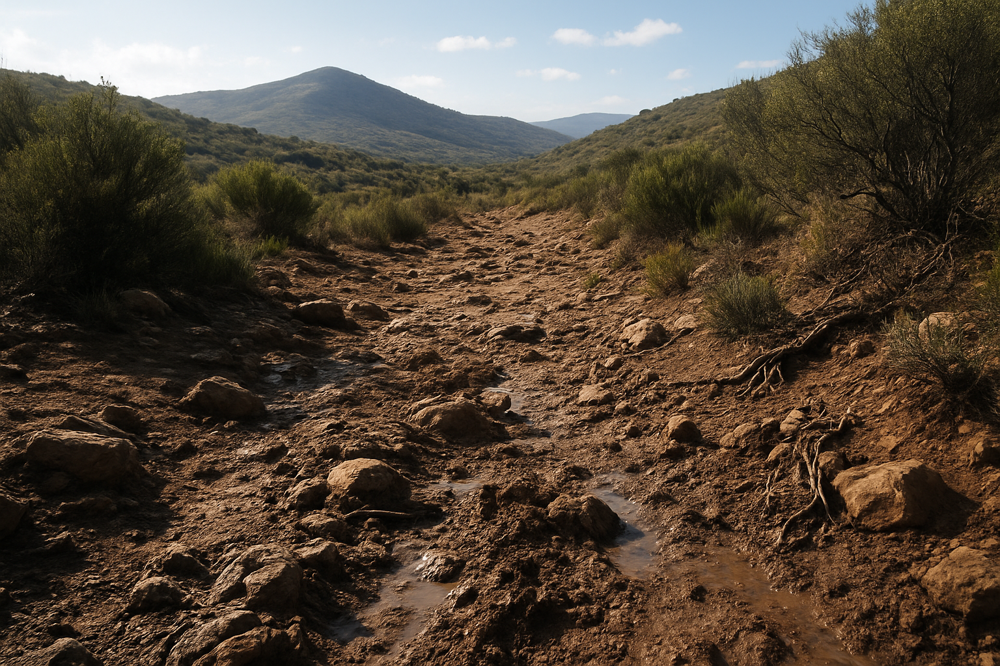

----------


100%|██████████| 49/49 [00:48<00:00,  1.00it/s]


<think>
The user wants to transform the off-road scene into a dense fog or heavy snowstorm setting. To achieve this, the layout and structure of the image should remain the same, including the rocky terrain, vegetation, and distant hills. The fog or snow should be introduced to obscure details, reducing visibility while maintaining the natural elements of the scene.
</think>


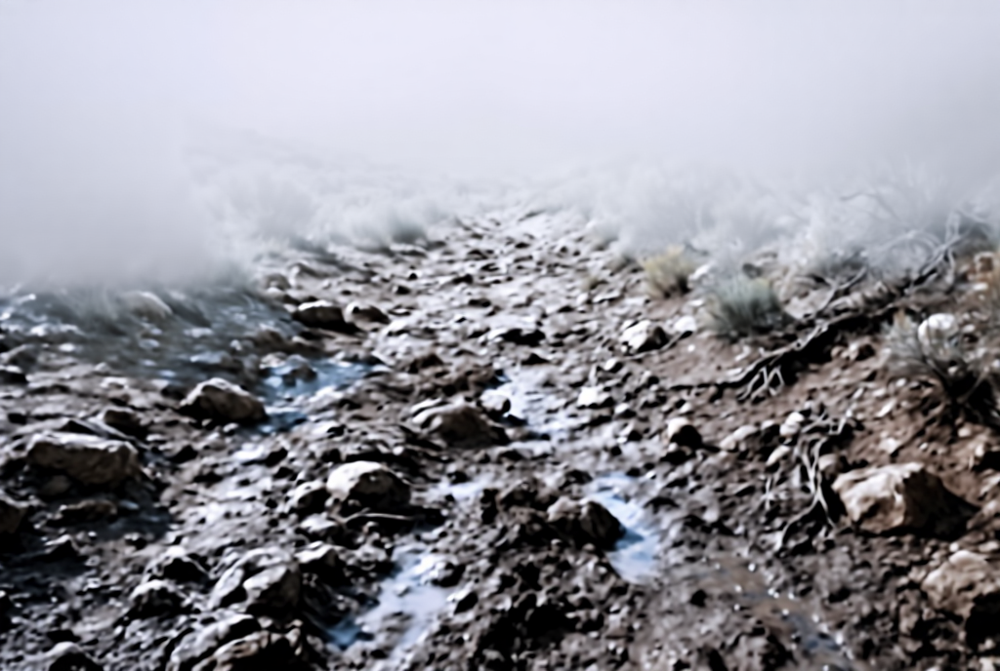

In [11]:
image = Image.open('test_images/yjf_test.png')
prompt = 'Transform this off-road scene—featuring uneven rocky terrain, scattered vegetation, and muddy ground—by introducing extreme weather conditions: convert the environment into a dense-fog scenario that significantly reduces visibility, or alternatively into a heavy-snowstorm setting where thick snowfall accumulates on the terrain and partially obscures surface features.'

display(image)
print('-'*10)
output_dict = inferencer(image=image, text=prompt, think=True, **inference_hyper)
print(output_dict['text'])
display(output_dict['image'])

## Understanding

In [ ]:
inference_hyper=dict(
    max_think_token_n=1000,
    do_sample=False,
    # text_temperature=0.3,
)

In [ ]:
image = Image.open('test_images/meme.jpg')
prompt = "Can someone explain what’s funny about this meme??"

display(image)
print(prompt)
print('-'*10)
output_dict = inferencer(image=image, text=prompt, understanding_output=True, **inference_hyper)
print(output_dict['text'])

## TaylorSeer Support for Inference Acceleration

In [ ]:
# Enable TaylorSeer (https://arxiv.org/abs/2503.06923) by setting enable_taylorseer=True in inference_hyper
# This feature is supported for tasks that involve image output, including image generation, image generation with think, editing, and edit with think.

# Below is an example of image generation with TaylorSeer enabled.
inference_hyper=dict(
    cfg_text_scale=4.0,
    cfg_img_scale=1.0,
    cfg_interval=[0.4, 1.0],
    timestep_shift=3.0,
    num_timesteps=50,
    cfg_renorm_min=0.0,
    cfg_renorm_type="global",
    enable_taylorseer=True,  # Enable TaylorSeer
)

In [ ]:
prompt = "A female cosplayer portraying an ethereal fairy or elf, wearing a flowing dress made of delicate fabrics in soft, mystical colors like emerald green and silver. She has pointed ears, a gentle, enchanting expression, and her outfit is adorned with sparkling jewels and intricate patterns. The background is a magical forest with glowing plants, mystical creatures, and a serene atmosphere."

print(prompt)
print('-' * 10)
output_dict = inferencer(text=prompt, **inference_hyper)
display(output_dict['image'])